In [1]:
import os, random
import matplotlib.pyplot as plt
import pyAgrum as gum
import pyAgrum.lib.notebook as gnb
import numpy as np
import pandas as pd

In [7]:
bn = gum.fastBN('Age{18-24|25-34|35-64}->Sex{male|female};' +
                                
                'diligence{1|2|3|4|5}->conscientiouness{R|S};'+
                'prudence{1|2|3|4|5}->conscientiouness;'+
                'flexibility{1|2|3|4|5}->agreeableness{R|S};'+
                'gentleness{1|2|3|4|5}->agreeableness;'+
                'patience{1|2|3|4|5}->agreeableness;'+
                'fairness{1|2|3|4|5}->honesty{R|S};'+
                'greed_avoidance{1|2|3|4|5}->honesty;'+
                'modesty{1|2|3|4|5}->honesty;'+
                'sincerity{1|2|3|4|5}->honesty;'+
                'liveliness{1|2|3|4|5}->extraversion{R|S};'+
                'sociability{1|2|3|4|5}->extraversion;'+
                'social_boldness{1|2|3|4|5}->extraversion;'+
                'openess{1|2|3|4|5}->experience{R|S};'+
                'dependence{1|2|3|4|5}->emotionality{R|S};'+
                
                'conscientiouness->Psychological_traits{R|S};'+
                'agreeableness->Psychological_traits;'+
                'honesty->Psychological_traits;'+
                'extraversion->Psychological_traits;'+
                'emotionality->Psychological_traits;'+
                'experience->Psychological_traits;'+
                
                'Sex->Personality_trait{R|N|S};'+
                'Psychological_traits->Personality_trait;'+
              
                'RR{Rest|Load}->Physiological_workload_markers{Rest|Load};' +
                'HR{Rest|Load}->Physiological_workload_markers;' +
                'Temp{Rest|Load}->Physiological_workload_markers;' +
                'GSR{Rest|Load}->Physiological_workload_markers;'+
                
                'Personality_trait->Workload{Rest|Load}<-Physiological_workload_markers;'
                )

In [8]:
class_w = [66, 49, 50, 51] #GSR, HR, RR, Temp
class_w_normalized = [w / sum(class_w) for w in class_w]
rounded_class_w_normalized = [round(w, 3) for w in class_w_normalized]
rounded_class_w_normalized



[0.306, 0.227, 0.231, 0.236]

In [9]:
np.sum(rounded_class_w_normalized)

1.0

HR 0 RR 0 GSR 0 Temp 0 == Rest: 1 , load 0
HR 0 RR 0 GSR 0 Temp 1 == Rest: 0.764 , load 0.236
HR 0 RR 0 GSR 1 Temp 0 == Rest: 0.694 , load 0.306
HR 0 RR 0 GSR 1 Temp 1 == Rest: 0.458 , load 0.542
HR 0 RR 1 GSR 0 Temp 0 == Rest: 0.769 , load 0.231
HR 0 RR 1 GSR 0 Temp 1 == Rest: 0.533 , load 0.467
HR 0 RR 1 GSR 1 Temp 0 == Rest: 0.463 , load 0.537
HR 0 RR 1 GSR 1 Temp 1 == Rest: 0.227 , load 0.773
HR 1 RR 0 GSR 0 Temp 0 == Rest: 0.773 , load 0.227
HR 1 RR 0 GSR 0 Temp 1 == Rest: 0.537 , load 0.463
HR 1 RR 0 GSR 1 Temp 0 == Rest: 0.467 , load 0.533
HR 1 RR 0 GSR 1 Temp 1 == Rest: 0.231 , load 0.769
HR 1 RR 1 GSR 0 Temp 0 == Rest: 0.542 , load 0.458
HR 1 RR 1 GSR 0 Temp 1 == Rest: 0.306 , load 0.694
HR 1 RR 1 GSR 1 Temp 0 == Rest: 0.236 , load 0.764
HR 1 RR 1 GSR 1 Temp 1 == Rest: 0.0 , load 1.0


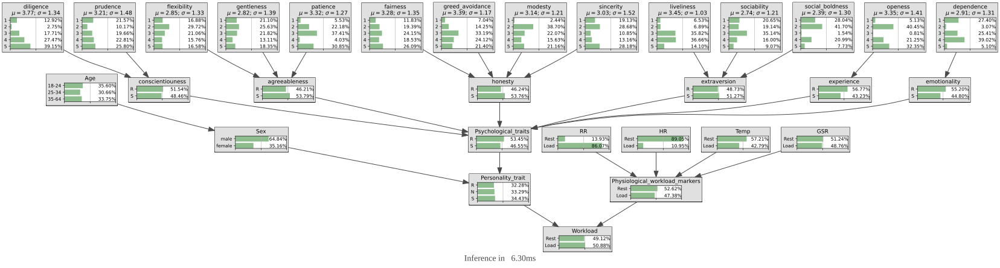

In [10]:
#populate the ML portion

bn.cpt("RR")[:]=1
bn.cpt("HR")[:]=1
bn.cpt("GSR")[:]=1
bn.cpt("Temp")[:]=1
bn.cpt("Physiological_workload_markers")[:]=1

frames = 30
skip = 1
cv=0
modelType = "TCN"

data=[[] for i in range(4)]
for index, p in enumerate(nodeList[:-1]):
    predict_path = f".\\save\\{modelType}\\{p}_frame{frames}_skip{skip}_cv{cv}_predict_test.npy"
    prediction = np.load(predict_path)

    rest = prediction==1

    bn.cpt(p)[:] = [sum(rest), len(rest)-sum(rest)]

    data[index].append(prediction)

    
data = np.array(data)
data=np.swapaxes(data,1,-1)
data = data[:,:,0]
import pandas as pd

df = pd.DataFrame(np.transpose(data), columns=nodeList[:-1])

# rounded_class_w_normalized: GSR 31, HR 23, RR 23, Temp 24

for hr in range(2):
    for rr in range(2):
        for gsr in range(2):
            for temp in range(2):   
                val = [rr,hr,temp,gsr]
                prob = 0
                if rr == 1:
                    prob = prob + rounded_class_w_normalized[2]
                if hr == 1:
                    prob = prob + rounded_class_w_normalized[1]
                if gsr == 1:    
                    prob = prob + rounded_class_w_normalized[0]
                if temp == 1:   
                    prob = prob + rounded_class_w_normalized[3]

                if prob > 1:
                    prob = 1
                if prob < 0:
                    prob = 0 
                    
                prob = round(prob, 3)

                bn.cpt("Physiological_workload_markers")[{'RR': rr, 'HR': hr, 'Temp': temp, 'GSR': gsr}]=[round(1-prob, 3), prob] 
                print ('HR', hr, 'RR', rr,  'GSR', gsr, 'Temp', temp,'== Rest:', round(1-prob, 3), ', load', prob)
#                 print ('RR', rr, 'HR', hr, 'Temp', temp, 'GSR', gsr, '== Rest:', round(1-prob, 3), ', load', prob)
                # bn.cpt("Physiological_workload_markers")[{'RR': rr, 'HR': hr, 'Temp': temp, 'GSR': gsr}]=[val.count(0), val.count(1)] 
gnb.showInference(bn, evs={}, size='45')            

In [11]:
print ('HR', hr, 'RR', rr,  'GSR', gsr, 'Temp', temp,'== Rest:', round(1-prob, 3), ', load', prob)

HR 1 RR 1 GSR 1 Temp 1 == Rest: 0.0 , load 1.0


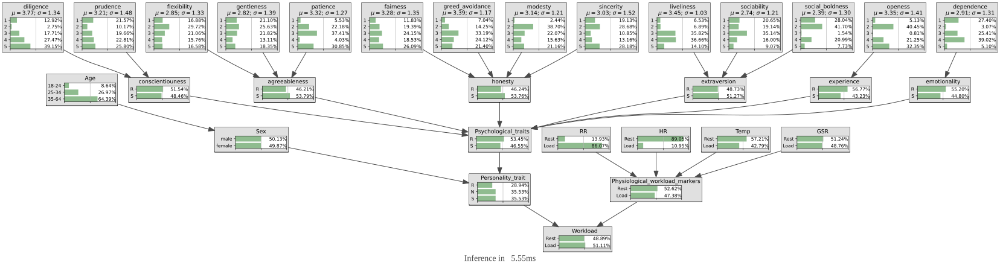

In [12]:
#Age + sex
# demogr = pd.read_csv('BN_data//age_sex.csv')
demogr = pd.read_csv('age_sex.csv')
bn.cpt('Age')[:] = (demogr['Total']/np.sum(demogr['Total'])).sort_index().values.tolist()

m = np.sum(demogr['Males'])
f = np.sum(demogr['Females'])
total = m+f

for i in range(0, 3): #age
    m = (demogr['Males'][i])
    f = (demogr['Females'][i])
    
    bn.cpt('Sex')[{'Age': i}] = [m, f]
gnb.showInference(bn, evs={}, size='45')    

In [13]:
person = pd.read_csv('personality_for_bn1.csv')

trait = ['diligence',
'prudence',
'flexibility',
'gentleness',
'patience',
'fairness',
'greed_avoidance',
'modesty',
'sincerity',
'liveliness',
'sociability',
'social_boldness',
'openess',
'dependence']
all_values = range(1, 6)

# Iterate through the list
for value in trait:
    #print(value)
    count = person[value].value_counts().sort_index()#.values.tolist()
    count = count.reindex(all_values, fill_value=0).values.tolist()
    bn.cpt(value)[:] = count/ np.sum(count)

#experience
for i in range(0, 5):
    # if person['openess'][i] >=3 :
    if i >=3:    
        prob = [0.9, 0.1]
    else:
        prob = [0.5, 0.5]
    bn.cpt('experience')[{'openess': i}] = prob
    

for i in range(0, 5):
    #emotionality
    bn.cpt('emotionality')[{'dependence': i}] = [0.5, 0.5]

for i in range(0, 5):
    for j in range(0, 5):
        for k in range(0, 5):
            #extraversion
            # stress = person['social_boldness'][i] + person['sociability'][j]
            # rest = person['liveliness'][k]
            stress = i + j
            rest = k
            if stress >= rest:
                prob = [0.33, 0.67]
            else:
                prob = [0.67, 0.33]
            bn.cpt('extraversion')[{'social_boldness': i, 'sociability': j, 'liveliness': k}] = prob    

for i in range(0, 5):
    for j in range(0, 5):
        for k in range(0, 5):
            for l in range(0, 5):
                #honesty
                # stress = person['fairness'][l] + person['greed_avoidance'][j] + person['modesty'][i]
                # rest = person['sincerity'][k] + person['fairness'][l]
                stress = l+j
                rest = k+l
                if stress >= rest:
                    prob = [0.4, 0.6]
                else:
                    prob = [0.6, 0.4]
                bn.cpt('honesty')[{'modesty': i, 'greed_avoidance': j, 'sincerity': k, 'fairness': l}] = prob 

for i in range(0, 5):
    for j in range(0, 5):
        for k in range(0, 5):
            #agreeableness
            # stress = person['gentleness'][j]
            # rest = person['flexibility'][i] + person['patience'][k]
            stress = j
            rest = i+k
            if stress >= rest:
                prob = [0.33, 0.67]
            else:
                prob = [0.67, 0.33]
            bn.cpt('agreeableness')[{'flexibility': i, 'gentleness': j, 'patience': k}] = prob  
            
for i in range(0, 5):
    for j in range(0, 5):
        #conscientiouness
        # stress = person['diligence'][i] + person['prudence'][j]
        stress = i+j
        if stress >= 5:
            prob = [0.1, 0.9]
        else:
            prob = [0.5, 0.5]
        bn.cpt('conscientiouness')[{'diligence': i, 'prudence': j}] = prob 
        
for i in range(0, 2): #experience
    for j in range(0, 2): #emotionality
        for k in range(0, 2): #extraversion
            for l in range(0, 2): #honesty
                for m in range(0, 2): #agreeableness
                    for n in range(0, 2): #conscientiouness
                        val = [i,j,k,l,m,n]
                        count_0 = val.count(0)
                        count_1 = val.count(1)
                        total = count_0+count_1
                        bn_val = {'experience': i, 'emotionality': j, 'extraversion': k, 'honesty': l, 'agreeableness': m, 'conscientiouness': n} 
                        bn.cpt('Psychological_traits')[bn_val] = [count_0/total, count_1/total]
                        

In [14]:
import itertools

col_person = ['sex_male', 'state', 'tlx_bool']
subset_df_person = person[col_person]
df_person = subset_df_person.groupby(col_person).size().reset_index(name="count")
df_person

# Generate all possible combinations of values and Convert the combinations into a DataFrame
combinations = list(itertools.product([0, 1], [0, 1, 2], [0, 1]))
combinations_df = pd.DataFrame(combinations, columns=df_person.columns[:-1])

merged_df = pd.merge(df_person, combinations_df, on=df_person.columns[:-1].tolist(), how='right')

# Fill missing values with 0 for the count column
merged_df['count'] = merged_df['count'].fillna(0)
merged_df = merged_df[df_person.columns]

#print(merged_df)
merged_df = merged_df.sort_values('tlx_bool').reset_index(drop=True)
#print(merged_df)
for index, row in merged_df.iloc[::3].iterrows():
    value_bn = {'Psychological_traits': int(merged_df['tlx_bool'][index]), 'Sex': int(merged_df['sex_male'][index])}
    prob = [merged_df['count'][index], merged_df['count'][index+1], merged_df['count'][index+2]]
    prob = prob/np.sum(prob)
    #print(value_bn, prob)
    bn.cpt('Personality_trait')[value_bn] = prob
    

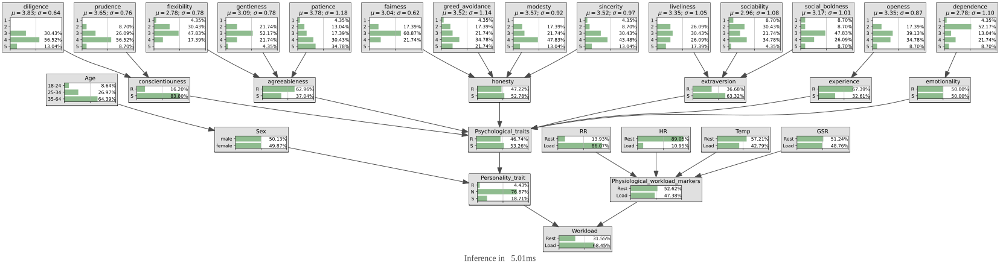

In [16]:
for i in range(0, 3): #Personality_trait
    for j in range(0, 2): #Physiological_workload_markers
        val = [i,j]
        
        bn.cpt("Workload")[{'Personality_trait': i, 'Physiological_workload_markers': j}]=[0.3*val.count(0), 0.2*val.count(1)+ 0.5*val.count(2)] 

bn.cpt('Workload').normalizeAsCPT()
gnb.showInference(bn, evs={}, size='45')    

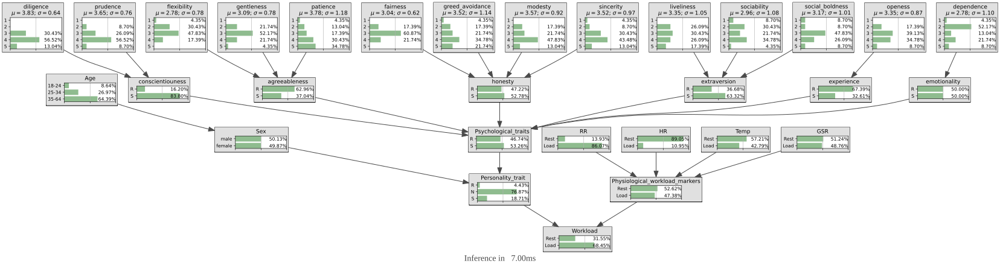

In [17]:
gnb.showInference(bn, evs={}, size='45')   

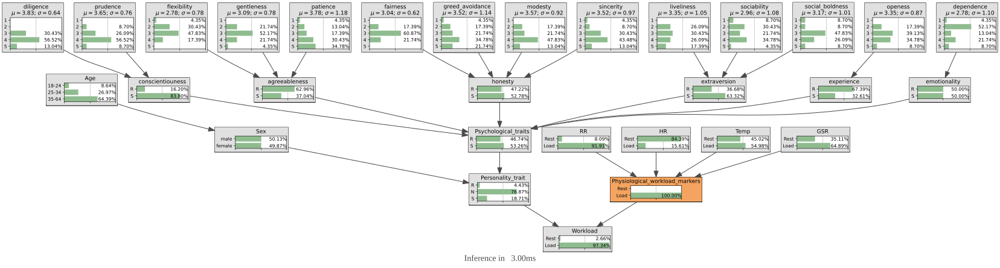

In [19]:
evs = {'Physiological_workload_markers': 1}
gnb.showInference(bn, evs=evs, size='45')

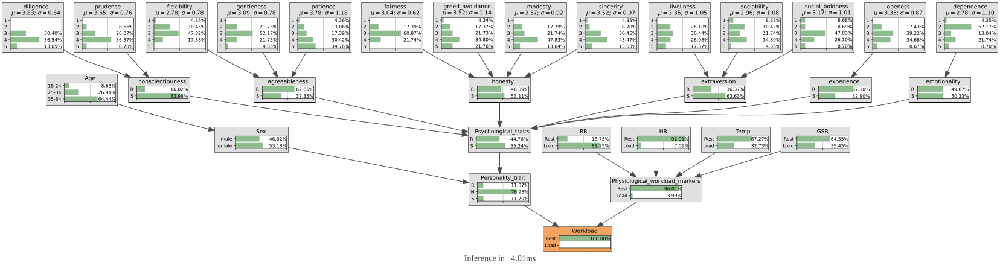

In [20]:
evs = {'Workload': 0}
gnb.showInference(bn, evs=evs, size='45')

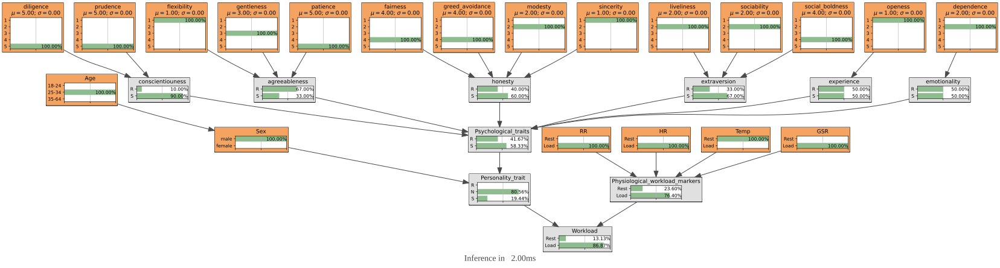

In [21]:
# evs = {'gentleness': 2, 'fairness': 3, 'greed_avoidance': 3, 'modesty': 1, 'sincerity': 0, 'liveliness': 1, 'sociability': 1, 'social_boldness': 1, 'openess': 1, 'dependence': 2, 'emotionality': 5, 'experience': 4, 'extraversion': 0, 'honesty': 0, 'agreeableness': 3, 'conscientiouness': 3, 'diligence': 2, 'prudence': 3, 'flexibility': 1, 'patience': 4, 'Age':1, 'Sex':0, 'RR':1, 'HR':1, 'Temp':1, 'GSR':0} 
evs = {'gentleness': 2, 'fairness': 3, 'greed_avoidance': 3, 'modesty': 1, 'sincerity': 0, 'liveliness': 1, 'sociability': 1, 'social_boldness': 3, 'openess': 0, 'dependence': 1,'diligence': 4, 'prudence': 4, 'flexibility': 0, 'patience': 4, 'Age':1, 'Sex':0, 'RR':1, 'HR':1, 'Temp':0, 'GSR':1} 

gnb.showInference(bn, evs=evs, size='45')

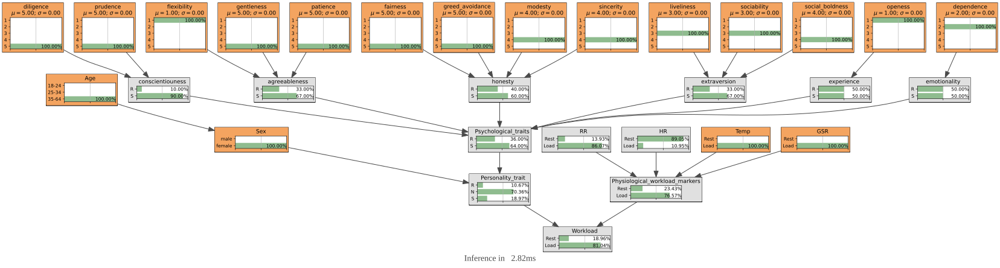

In [23]:
# evs = {'gentleness': 2, 'fairness': 3, 'greed_avoidance': 3, 'modesty': 1, 'sincerity': 0, 'liveliness': 1, 'sociability': 1, 'social_boldness': 1, 'openess': 1, 'dependence': 2, 'emotionality': 5, 'experience': 4, 'extraversion': 0, 'honesty': 0, 'agreeableness': 3, 'conscientiouness': 3, 'diligence': 2, 'prudence': 3, 'flexibility': 1, 'patience': 4, 'Age':1, 'Sex':0, 'RR':1, 'HR':1, 'Temp':1, 'GSR':0} 
evs = {'gentleness': 4, 'fairness': 4, 'greed_avoidance': 4, 'modesty': 3, 'sincerity': 3, 'liveliness': 2, 'sociability': 2, 'social_boldness': 3, 'openess': 0, 'dependence': 1,'diligence': 4, 'prudence': 4, 'flexibility': 0, 'patience': 4, 'Age':2, 'Sex':1, 'Temp':1, 'GSR':1} 

gnb.showInference(bn, evs=evs, size='45')

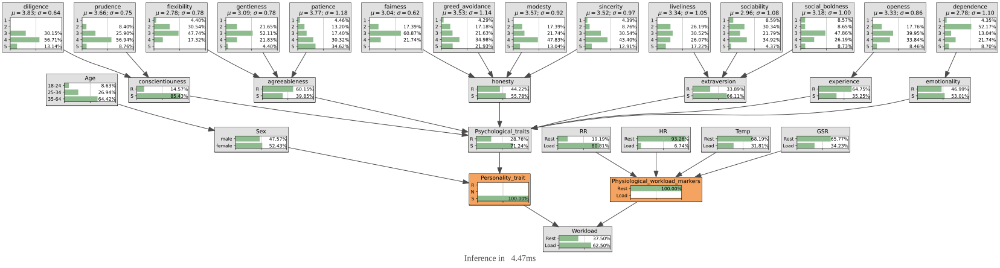

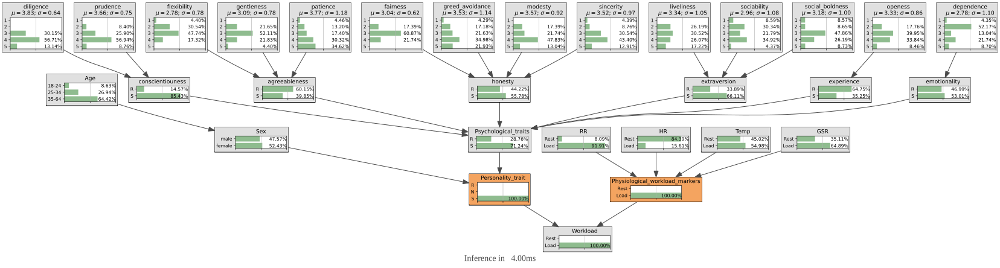

In [27]:
evs = {'Personality_trait': 2, 'Physiological_workload_markers':0}
gnb.showInference(bn, evs=evs, size='35')
evs = {'Personality_trait': 2, 'Physiological_workload_markers':1}
gnb.showInference(bn, evs=evs, size='35')

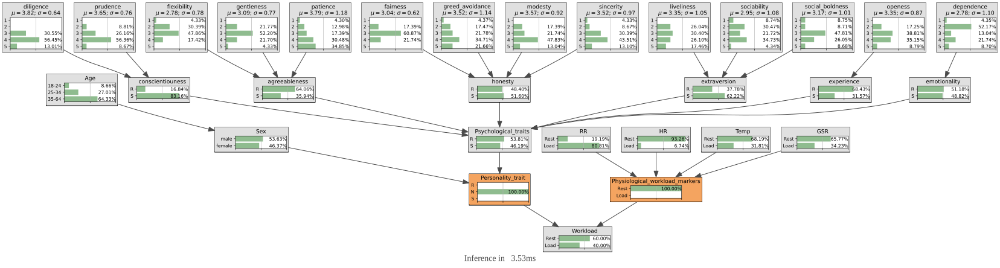

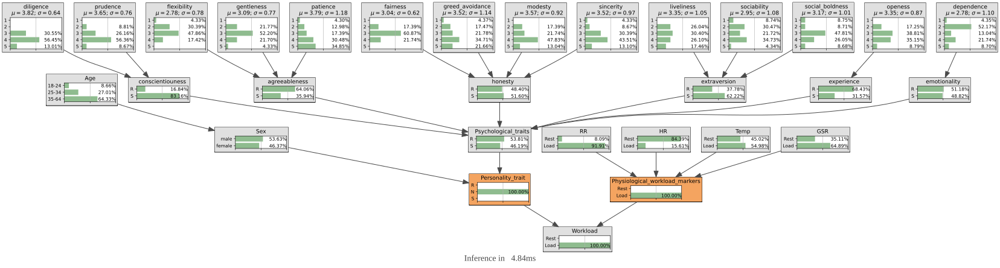

In [28]:
evs = {'Personality_trait': 1, 'Physiological_workload_markers':0}
gnb.showInference(bn, evs=evs, size='35')
evs = {'Personality_trait': 1, 'Physiological_workload_markers':1}
gnb.showInference(bn, evs=evs, size='35')

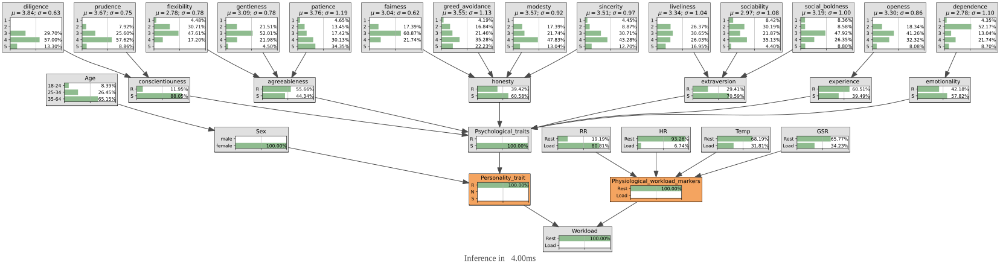

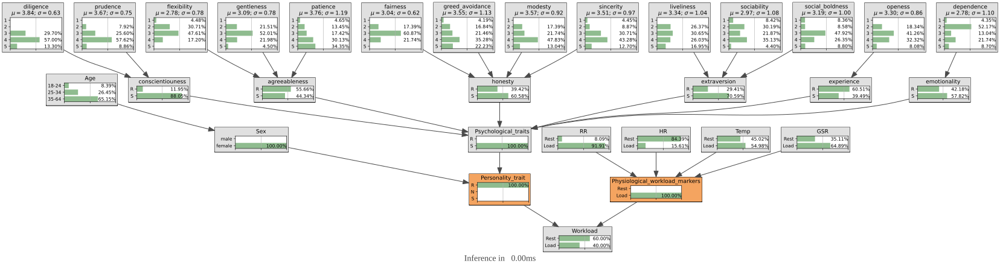

In [29]:
evs = {'Personality_trait': 0, 'Physiological_workload_markers':0}
gnb.showInference(bn, evs=evs, size='35')
evs = {'Personality_trait': 0, 'Physiological_workload_markers':1}
gnb.showInference(bn, evs=evs, size='35')

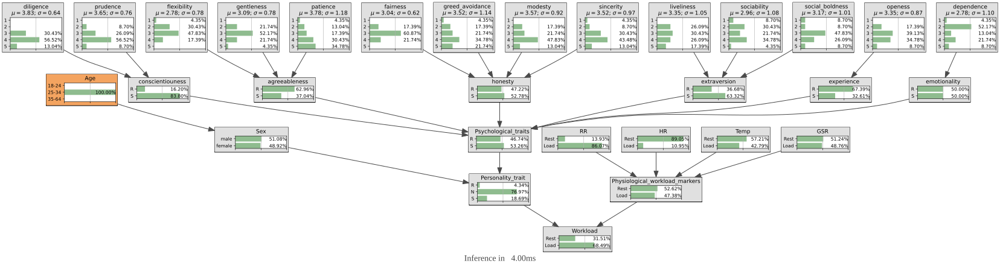

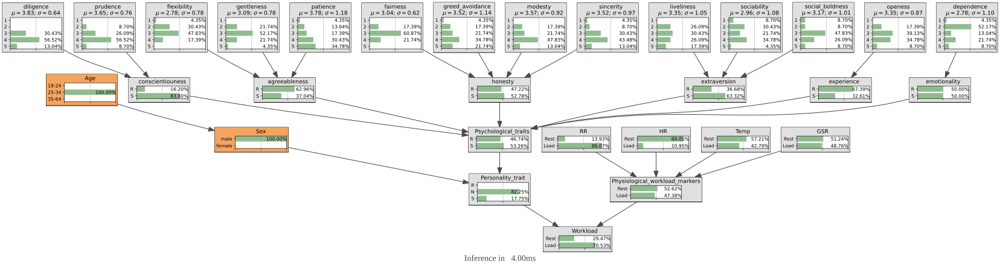

In [30]:
evs = {'Age': 1}
gnb.showInference(bn, evs=evs, size='35')
evs = {'Age': 1, 'Sex':0}
gnb.showInference(bn, evs=evs, size='35')

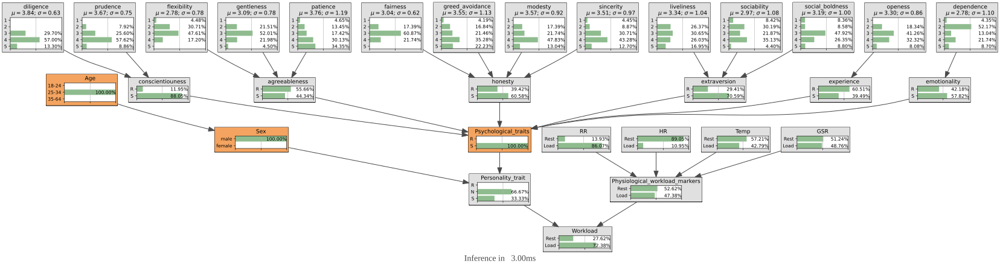

In [31]:
evs = {'Psychological_traits': 1, 'Age': 1, 'Sex':0}
gnb.showInference(bn, evs=evs, size='35')
# evs = {'Psychological_traits': 1, 'Sex':0}
# gnb.showInference(bn, evs=evs, size='35')

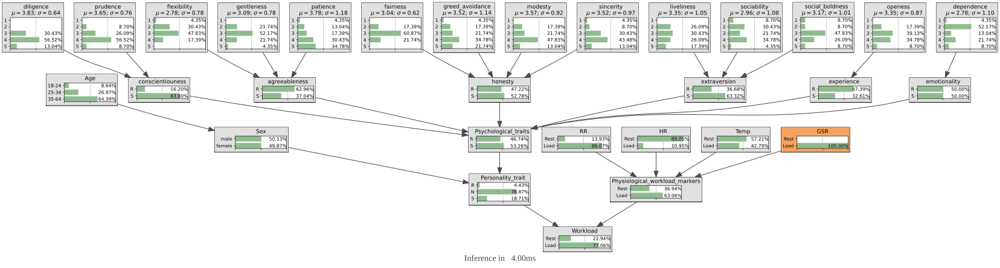

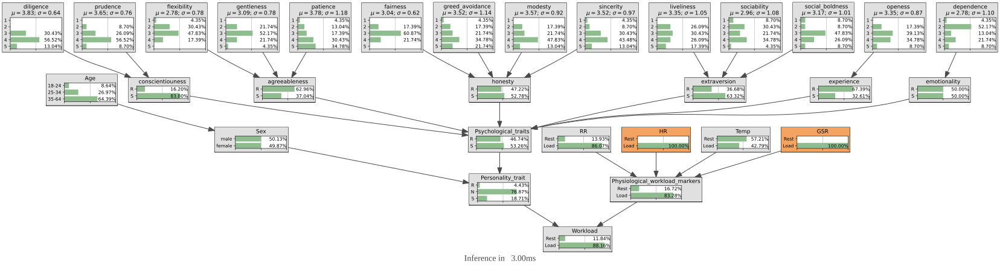

In [32]:
evs = {'GSR': 1}
gnb.showInference(bn, evs=evs, size='35')
evs = {'GSR': 1, 'HR':1}
gnb.showInference(bn, evs=evs, size='35')

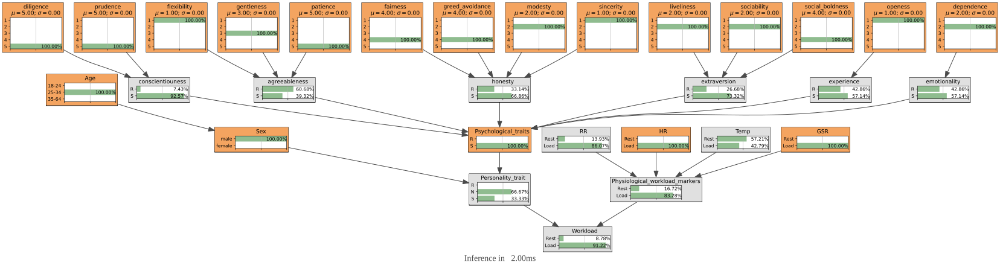

In [33]:
# evs = {'gentleness': 2, 'fairness': 3, 'greed_avoidance': 3, 'modesty': 1, 'sincerity': 0, 'liveliness': 1, 'sociability': 1, 'social_boldness': 1, 'openess': 1, 'dependence': 2, 'emotionality': 5, 'experience': 4, 'extraversion': 0, 'honesty': 0, 'agreeableness': 3, 'conscientiouness': 3, 'diligence': 2, 'prudence': 3, 'flexibility': 1, 'patience': 4, 'Age':1, 'Sex':0, 'RR':1, 'HR':1, 'Temp':1, 'GSR':0} 
evs = {'gentleness': 2, 'fairness': 3, 'greed_avoidance': 3, 'modesty': 1, 'sincerity': 0, 'liveliness': 1, 'sociability': 1, 'social_boldness': 3, 'openess': 0, 'dependence': 1,'diligence': 4, 'prudence': 4, 'flexibility': 0, 'patience': 4, 'Age':1, 'Sex':0, 'HR':1, 'GSR':1, 'Psychological_traits':1} 

gnb.showInference(bn, evs=evs, size='45')